<a href="https://colab.research.google.com/github/autech2022-ea/tech_challenge_2022/blob/main/BriefExplanationAndDriver.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# ☑️ Technical Assigment: Enrique ☑️

Hello! Welcome to this technical assigment. 
**Thank you for taking the time to review it!!**

## 🚪 Introduction

Let's get right into it. First we need to clone the repository and install 
Pytorch lightning, which is not installed by default in Google Colab.

In [1]:
!git clone https://github.com/autech2022-ea/tech_challenge_2022.git tc_ea2022
!pip install pytorch_lightning --quiet

Cloning into 'tc_ea2022'...
remote: Enumerating objects: 720, done.
remote: Counting objects: 100% (720/720), done.
remote: Compressing objects: 100% (652/652), done.
remote: Total 720 (delta 67), reused 714 (delta 65), pack-reused 0
Receiving objects: 100% (720/720), 11.01 MiB | 31.59 MiB/s, done.
Resolving deltas: 100% (67/67), done.
     |████████████████████████████████| 585 kB 7.6 MB/s 
     |████████████████████████████████| 419 kB 54.5 MB/s 
     |████████████████████████████████| 596 kB 51.3 MB/s 
     |████████████████████████████████| 140 kB 62.6 MB/s 
     |████████████████████████████████| 1.1 MB 55.6 MB/s 
     |████████████████████████████████| 144 kB 74.8 MB/s 
     |████████████████████████████████| 271 kB 62.7 MB/s 
     |████████████████████████████████| 94 kB 4.4 MB/s 


Next, we import everything we will need. The imports are more or less divided by the type and by the parent library.

In [2]:
import random
import numpy as np
from glob import glob
import torchvision

# import the cloned files
import tc_ea2022

import sys
sys.path.append('./tc_ea2022/')

from tc_ea2022 import utils
from tc_ea2022 import datasets
from tc_ea2022 import transforms as tr
from tc_ea2022 import train
from tc_ea2022.train import run_train

We will need tensorboard later on

In [3]:
# Load the TensorBoard notebook extension
%load_ext tensorboard

We then define few constants we will use in the rest of the code

In [4]:
# The input size of the images to feed the network
TILE_SIZE = 256

# Validate N number of images after augmentations
IMAGES_TO_VERIFY = 10

# Where to store the datasets
DATA_DIRECTORY = "./tc_ea2022/data"

And then mkdir a few directories that we will need

In [5]:
!mkdir -p vis
!mkdir -p checkpoints

## 🧭 Exploring the dataset

Before starting using the PyTorch dataset utilities, we do a very basic exploration of the dataset, just to get an idea of how it looks.

In [6]:
classes = [f.split("/")[-1] for f in glob(f"{DATA_DIRECTORY}/*")]
print(f"The different classes are {classes}")

The different classes are ['unchecked', 'other', 'checked']


In [7]:
total_images = 0
for c in classes:
  files = glob(f"{DATA_DIRECTORY}/{c}/*png")
  print(f"There are {len(files)} for the class '{c}'")
  total_images += len(files)
print(f"TOTAL  =  {total_images}")

There are 155 for the class 'unchecked'
There are 138 for the class 'other'
There are 222 for the class 'checked'
TOTAL  =  515


### 🖼️ Show a few examples of each class

We use the util function `show_images` to show a few examples of each of the classes. The plots with example images are also stored in `./vis/`. So they can be downloaded, etc.

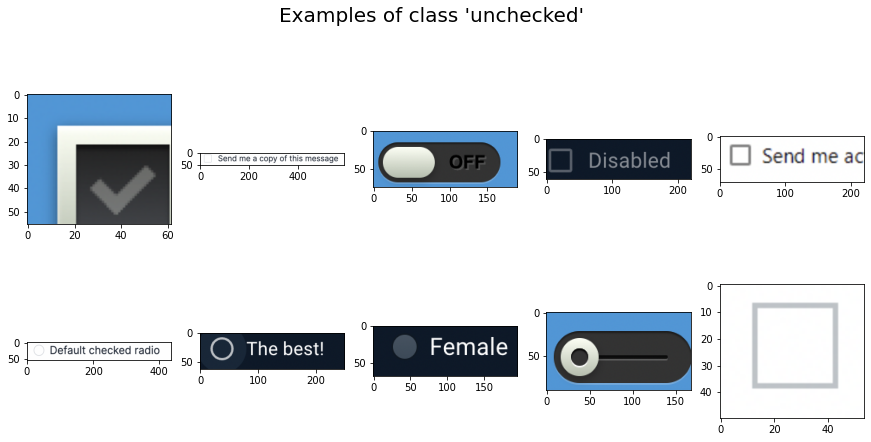

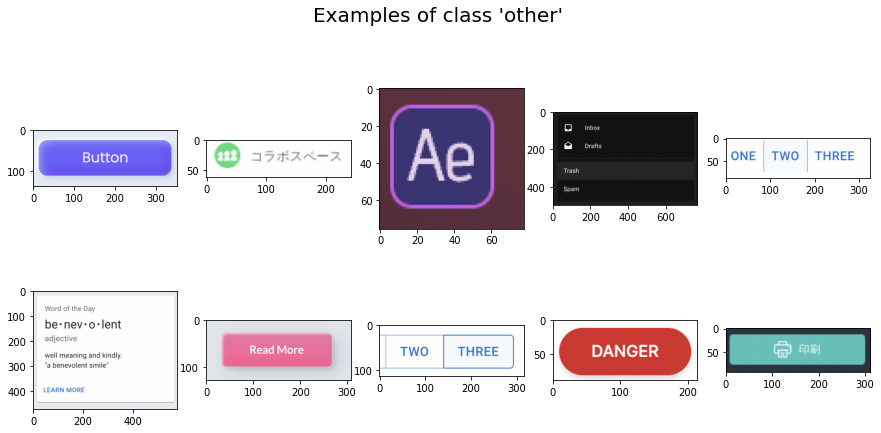

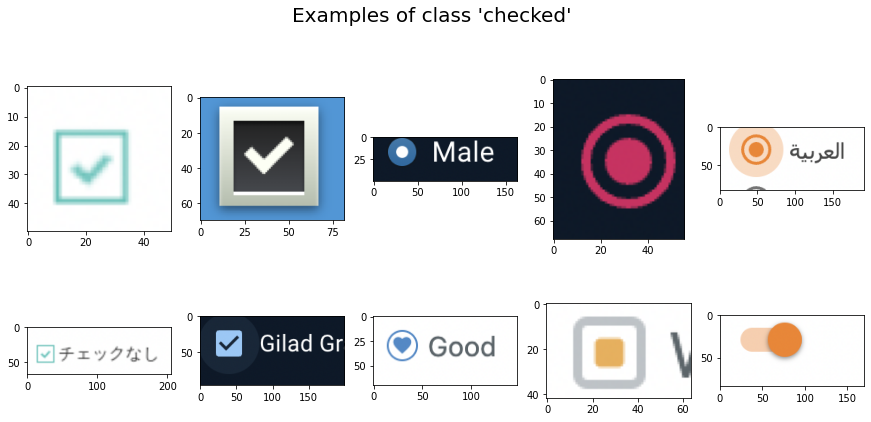

In [8]:
for c in classes:
  files = glob(f"{DATA_DIRECTORY}/{c}/*png")
  utils.show_images(random.choices(files, k=10),
                    title=f"Examples of class '{c}'",
                    save_path=f"vis/examples_of_{c}.png",
                    columns=5,
                    figsize=(15, 10))

That will give us a very good idea on how the images look, and the difference between the classes.

## 📋 Designing the transformations

After analyzing and reflecting on the transformations to work with this kind of web UI elements, I came with the following conclusions, which served as the starting point to design the transformation pipelines:

- Rotations and affine transformations do not make a lot of sense, since UI elements are usually completely horizontal or vertical.
- Horizontal flips would be totally destructive. Some kind of switches are just points moving to the right to mark as checked.
- Vertical flips may make sense in some cases, but I decided not to use them either.
- We can be very aggresive with color transformations. It seems like for the great mayority of the UI elements, the color is not important to describe its checked/unchecked status.
- The images come in all sorts of shapes. It would help to find a way to standarize their shape in a very deliverate way. 
- Some images come with text. In a more sophisticated version of this system, it would be good to segment and probably remove all the text oustide the checkbox-like element

### 🚇 Declaring the transformations pipelines

After designing and declaring all the transformations we create a series of different pipelines of transformations and augmentations

- `get_train_compose`: Contains every possible augmentation we can thing of, plus the transformations to feed to the NN.
- `get_val_compose`: Contains the same augmentations as train, but no normalization. This is designed so we (as humans) can easily verify the augmentations make sense.
- `get_verify_compose`: For the validation set, we do not want to run augmentations, so we only run the transformations to feed into the NN.

Let's declare an instance of `get_train_compose`. We are going to use it to manually verify our augmentations.

In [9]:
verify_transforms = tr.get_verify_compose(TILE_SIZE)

## 🗂️ Define the datasets

We define two different datasets for `training` and for `validation`. This is because we want to apply two different set of transformations.

- Apply random augmentations to the training set
- Don't apply augmentations to the validation set, only resize and convert to normalized tensor.

Additionally we definy `verify_dataset`, which is designed to be seen and verified by humans instead of feeding it to the NN.

In [10]:
verify_dataset = torchvision.datasets.ImageFolder(DATA_DIRECTORY, 
                                                  transform=verify_transforms)

### 🧐 Verify the augmentations

In this section we plot several examples of images before and after augmentations. We want to verify 

- Augmentations are working correctly
- Augmentations do not change the meaning of the label
- There are interesting variations of the same image

The plots with example images are also stored in `./vis/`. So they can be downloaded, etc.

In [11]:
total_instances = len(verify_dataset)
indices = list(range(total_instances))
random.seed(111)
verify_indexes = random.choices(indices, k=IMAGES_TO_VERIFY)
print(f"Indexes to verify = {verify_indexes}")

Indexes to verify = [425, 109, 485, 254, 204, 317, 87, 99, 217, 118]


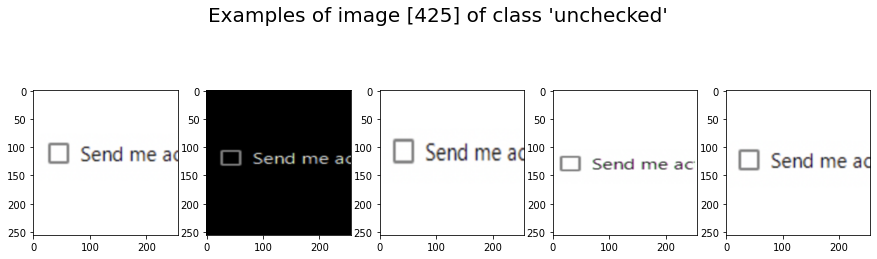

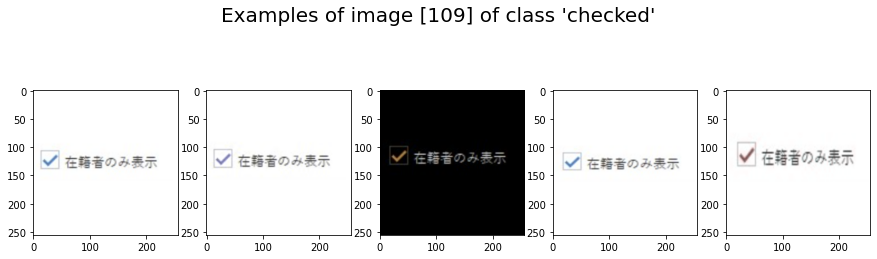

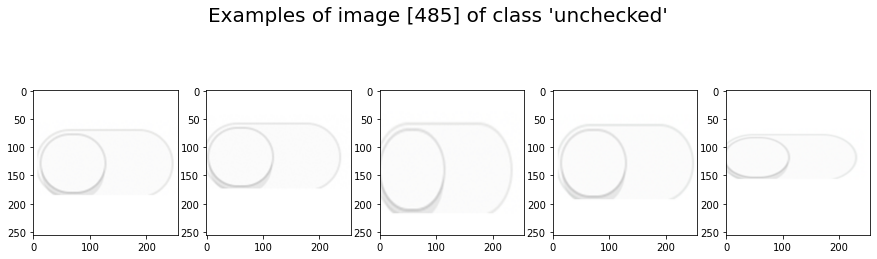

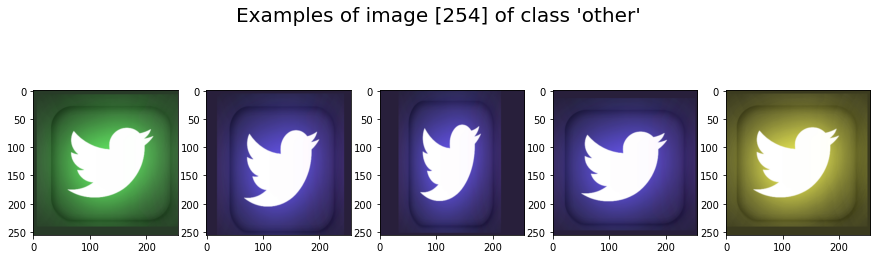

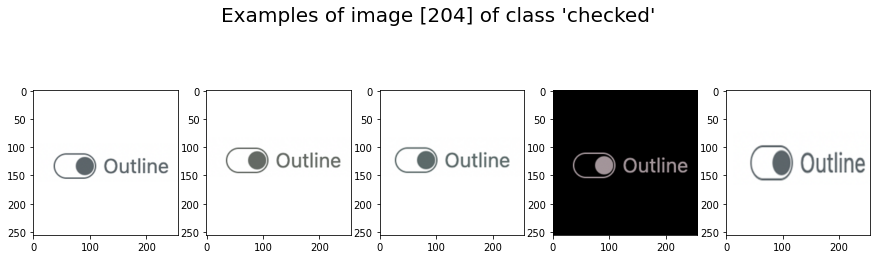

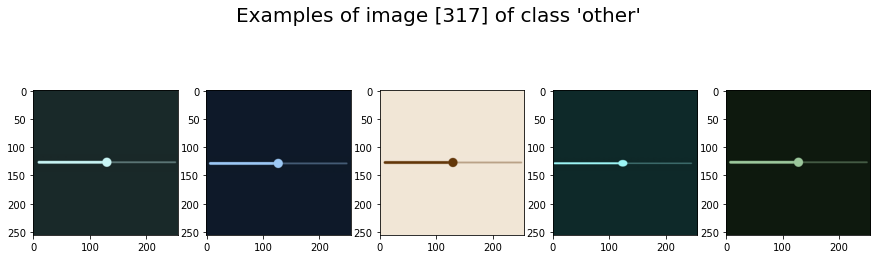

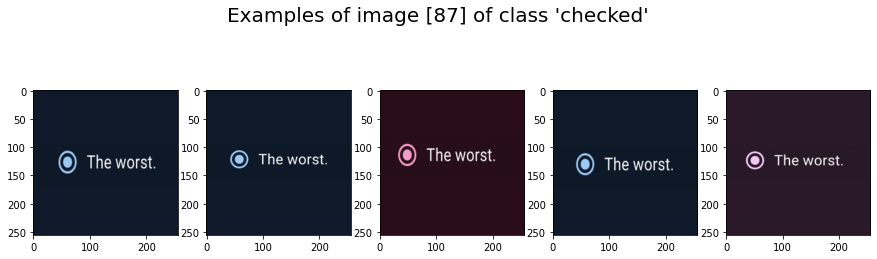

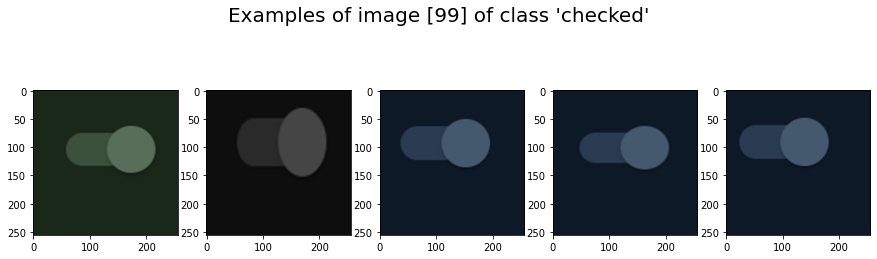

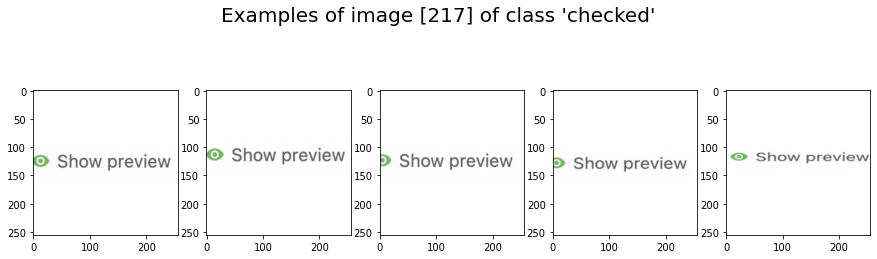

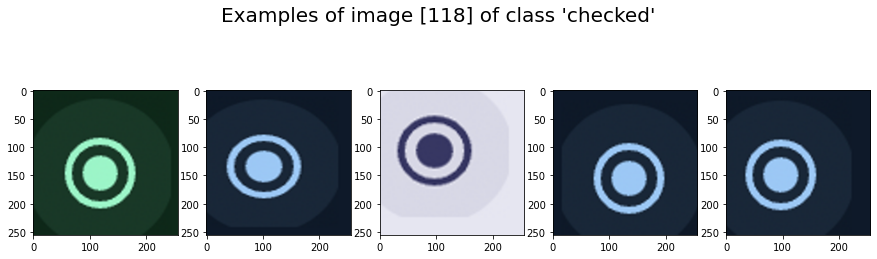

In [12]:
datasets.DEFAULT_DATASET_LOCATION = "./tc_ea2022/data"
id_to_class = datasets.id_to_class()

for index in verify_indexes:
  images = []
  for _ in range(5):
    class_name = id_to_class[verify_dataset[index][1]]
    images.append(np.array(verify_dataset[index][0]))

  utils.show_images(images, columns=5, figsize=(15, 8),
                    title=f"Examples of image [{index}] of class '{class_name}'",
                    save_path=f"vis/verify_aug_{index}_{class_name}.png")

## 🧱 About the backbone of the model

As explained in the README.md, we can use one of several different backbones for the classifier.

For now, the options are:

- "resnet18"
- "resnte34" **(default)**
- "resnet50"
- "vit_b_16"
- "convnext_tiny"
- "efficientnet_b3"
- "efficientnet_b5"

# Run the inference script

There are a few example images in the repository, we can use the inference script to predict their classes.

In [13]:
!cd tc_ea2022 && python infer.py \
  --backbone_name "resnet34" \
  --directory_location "./test_dataset/checked" \
  --result_csv "results_of_samples.csv"

Downloading...
From: https://drive.google.com/uc?id=1JfMkHFBjV2cTGHMM65JSnJN8fnFHYW2i
To: /content/tc_ea2022/trained_models/resnet34/val_acc=0.974-val_loss=0.799-epoch=31.ckpt
100% 170M/170M [00:01<00:00, 138MB/s]
MESSAGE: Checkpoint used:
        ./trained_models/resnet34/val_acc=0.974-val_loss=0.799-epoch=31.ckpt
Downloading: "https://download.pytorch.org/models/resnet34-b627a593.pth" to /root/.cache/torch/hub/checkpoints/resnet34-b627a593.pth
100% 83.3M/83.3M [00:02<00:00, 43.6MB/s]
The image at path:  './test_dataset/checked/checked0.png'
Was predicted as:   0:'checked'
Original output is: [-3.5541895e-04 -1.1208739e+01 -7.9812417e+00]
 =  =  =  =  =  =  =  =  =  =  =  =  =  =  =  =  =  =  =  =  =  =  =  =  =  =  =  =  =  =  =  =  =  =  =  =  =  =  =  = 
The image at path:  './test_dataset/checked/checked1.png'
Was predicted as:   0:'checked'
Original output is: [-7.8423461e-03 -1.0093098e+01 -4.8574500e+00]
 =  =  =  =  =  =  =  =  =  =  =  =  =  =  =  =  =  =  =  =  =  =  =  =  =

The results will be stored in the file we specified **`results_of_samples.csv`**:

In [14]:
!cat ./tc_ea2022/results_of_samples.csv

./test_dataset/checked/checked0.png,0:checked
./test_dataset/checked/checked1.png,0:checked
./test_dataset/checked/checked10.png,2:unchecked
./test_dataset/checked/checked11.png,0:checked
./test_dataset/checked/checked12.png,0:checked
./test_dataset/checked/checked13.png,1:other
./test_dataset/checked/checked14.png,0:checked
./test_dataset/checked/checked15.png,0:checked
./test_dataset/checked/checked16.png,1:other
./test_dataset/checked/checked17.png,0:checked
./test_dataset/checked/checked18.png,0:checked
./test_dataset/checked/checked19.png,0:checked
./test_dataset/checked/checked2.png,0:checked
./test_dataset/checked/checked20.png,0:checked
./test_dataset/checked/checked21.png,1:other
./test_dataset/checked/checked22.png,0:checked
./test_dataset/checked/checked23.png,0:checked
./test_dataset/checked/checked24.png,0:checked
./test_dataset/checked/checked25.png,0:checked
./test_dataset/checked/checked26.png,0:checked
./test_dataset/checked/checked27.png,0:checked
./test_dataset/check

## ⚠️ Error analysis

All the files in the directory are of `checked` class.
With the list of files and predictions, it is easy to find the instances where the prediction was incorrect. Let's quickly take a look at a couple of this files classified incorrectly as 'other':

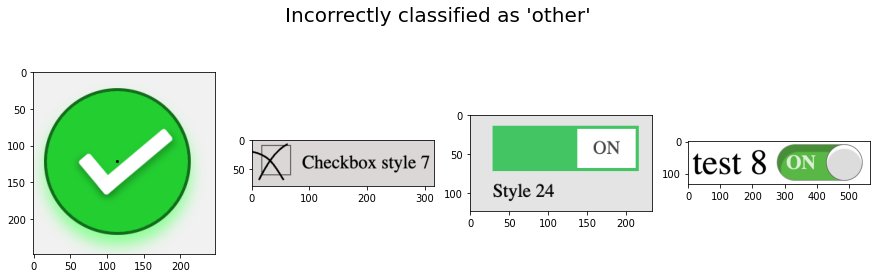

In [15]:
incorrect = [
    "checked44.png", "checked9.png", "checked34.png", "checked21.png"
]
utils.show_images(["./tc_ea2022/test_dataset/checked/" + i for i in incorrect],
                  title=f"Incorrectly classified as 'other'",
                  save_path=f"vis/incorrectly_classified.png",
                  columns=4,
                  figsize=(15, 8))

# 🏃 Run the training script

Now we will show how to run the training script. 
Before that, we are going to load the tensorboard plugin, so we can see the progress in real time

In [16]:
%tensorboard --logdir=lightning_logs/

<IPython.core.display.Javascript object>

In [17]:
# This almost workd: the progressbar is not shown correctly!
# !cd tc_ea2022 && python train.py \
#   --backbone_name "resnet18" \
#   --max_epochs 100 \
#   --learning_rate 0.001 \
#   --batch_size 16 \

In [18]:
train.TEST_SET_DIR = './tc_ea2022/test_dataset/'
run_train(
    "resnet34",
    train.DEFAULT_CHECKPOINTS_LOCATION,
    train.DEFAULT_LR,
    train.DEFAULT_BATCH_SIZE,
    train.DEFAULT_EPOCHS,
    train.DEFAULT_GPUS,
    train.DEFAULT_NUM_WORKERS,
    "./tc_ea2022/data",
)

/usr/local/lib/python3.7/dist-packages/pytorch_lightning/trainer/connectors/callback_connector.py:97: LightningDeprecationWarning: Setting `Trainer(progress_bar_refresh_rate=3)` is deprecated in v1.5 and will be removed in v1.7. Please pass `pytorch_lightning.callbacks.progress.TQDMProgressBar` with `refresh_rate` directly to the Trainer's `callbacks` argument instead. Or, to disable the progress bar pass `enable_progress_bar = False` to the Trainer.
  f"Setting `Trainer(progress_bar_refresh_rate={progress_bar_refresh_rate})` is deprecated in v1.5 and"
GPU available: True, used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
Missing logger folder: lightning_logs/resnet34
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name       | Type            | Params
-----------------------------------------------
0 | model      | ResNet          | 21.3 M
1 | confmatrix | ConfusionMatrix | 0     
--------------------------------

Sanity Checking: 0it [00:00, ?it/s]

Training: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

val Epoch 11: Acc: 0.8333
val Confusion Matrix = tensor([[28,  2,  0],
        [ 2, 15,  3],
        [ 5,  1, 22]], device='cuda:0')
train Epoch 11: Acc: 0.9657
train Confusion Matrix = tensor([[184,   1,   7],
        [  0, 117,   1],
        [  5,   1, 121]], device='cuda:0')


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

val Epoch 21: Acc: 0.9231
val Confusion Matrix = tensor([[30,  0,  0],
        [ 1, 16,  3],
        [ 1,  1, 26]], device='cuda:0')
train Epoch 21: Acc: 0.9748
train Confusion Matrix = tensor([[187,   0,   5],
        [  2, 116,   0],
        [  3,   1, 123]], device='cuda:0')


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

val Epoch 31: Acc: 0.9103
val Confusion Matrix = tensor([[29,  0,  1],
        [ 1, 17,  2],
        [ 2,  1, 25]], device='cuda:0')
train Epoch 31: Acc: 0.9908
train Confusion Matrix = tensor([[189,   1,   2],
        [  0, 118,   0],
        [  1,   0, 126]], device='cuda:0')


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

val Epoch 41: Acc: 0.9231
val Confusion Matrix = tensor([[30,  0,  0],
        [ 1, 17,  2],
        [ 2,  1, 25]], device='cuda:0')
train Epoch 41: Acc: 0.9886
train Confusion Matrix = tensor([[190,   0,   2],
        [  0, 117,   1],
        [  2,   0, 125]], device='cuda:0')


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

val Epoch 51: Acc: 0.9231
val Confusion Matrix = tensor([[29,  0,  1],
        [ 1, 17,  2],
        [ 2,  0, 26]], device='cuda:0')
train Epoch 51: Acc: 0.9886
train Confusion Matrix = tensor([[189,   1,   2],
        [  0, 118,   0],
        [  2,   0, 125]], device='cuda:0')


Validation: 0it [00:00, ?it/s]

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


FINISHED TRAINING
This is the path of the best model (per val_acc):
/content/checkpoints/resnet34/val_acc=0.936-val_loss=0.235-epoch=26.ckpt
 =  =  =  =  =  =  =  =  =  =  =  =  =  =  =  =  =  =  =  =  =  =  =  =  =  =  =  =  =  =  =  =  =  =  =  =  =  =  =  =  =  =  =  =  =  =  =  =  =  = 
Going to test with the TEST_SET:


Testing: 0it [00:00, ?it/s]

test Epoch 53: Acc: 0.7530
test Confusion Matrix = tensor([[45,  8,  2],
        [12, 44,  1],
        [ 7, 11, 36]], device='cuda:0')
TEST_SET Metrics = {'test_loss': 0.8896387815475464, 'test_acc': 0.7530120611190796}


Analyzing the result of the training run:

- The best model was saved at this path. Of course we can run `infer.py` with these new weights

```
FINISHED TRAINING
This is the path of the best model (per val_acc):
/content/checkpoints/resnet34/val_acc=0.936-val_loss=0.235-epoch=26.ckpt
```

- After the training, the model is tested on a totally different dataset that I created, at the end we print the metrics and confusion matrix of this dataset:

```
test Epoch 53: Acc: 0.7530
test Confusion Matrix = tensor([[45,  8,  2],
        [12, 44,  1],
        [ 7, 11, 36]], device='cuda:0')
TEST_SET Metrics = {'test_loss': 0.8896387815475464, 'test_acc': 0.7530120611190796}
```

